<a href="https://colab.research.google.com/github/MariiaS/from_shallow_to_deeplearning/blob/main/First_project_Mariia_Solodiankina.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



> ***From Shallow to Deep Representation for multimedia database***

> Copy link to the notebook. Please, take a look at the notebook in Colab to avoid the mistakes. https://colab.research.google.com/drive/1Wkipn_Gibql980bAbRWOOfGWoOqJjteW?usp=sharing 




**FIRST Project** *- Image Retrieval (Near Duplicate)*

Links towards datasets: https://drive.google.com/drive/folders/1svpfJcfUcSezlkNsiN94Aw1YdReEa84R?usp=sharing

In [ ]:
import os
import numpy as np
import torchvision.datasets as datasets
%matplotlib inline
from matplotlib import pyplot as plt
from google.colab import drive
drive.mount('/content/drive') 

Mounted at /content/drive


Find the path using `!ls` and `cd` to the needed folder, where the shortcut to the shared folder was saved.

In [ ]:
path = "/content/drive/MyDrive/Study/MultimediaDeepLearning/VOC2007"

In [ ]:
os.chdir(path)
os.listdir(path)

['VOCtrainval_06-Nov-2007.tar',
 'VOCtest_06-Nov-2007.tar',
 'VOCdevkit',
 'VOCtrainval_06-Nov-2007.tar (Unzipped Files)']

In [ ]:
voc_trainset = datasets.VOCDetection(path, year='2007', image_set='train', download=False)
print(len(voc_trainset))

2501


In [ ]:
image, annotation = voc_trainset[500][0],voc_trainset[500][1]
print(annotation)

{'annotation': {'folder': 'VOC2007', 'filename': '002034.jpg', 'source': {'database': 'The VOC2007 Database', 'annotation': 'PASCAL VOC2007', 'image': 'flickr', 'flickrid': '315540860'}, 'owner': {'flickrid': 'Huro Kitty', 'name': 'Michelle Chin'}, 'size': {'width': '500', 'height': '288', 'depth': '3'}, 'segmented': '0', 'object': [{'name': 'cat', 'pose': 'Right', 'truncated': '0', 'difficult': '0', 'bndbox': {'xmin': '8', 'ymin': '122', 'xmax': '207', 'ymax': '288'}}, {'name': 'dog', 'pose': 'Right', 'truncated': '0', 'difficult': '0', 'bndbox': {'xmin': '272', 'ymin': '69', 'xmax': '474', 'ymax': '199'}}]}}


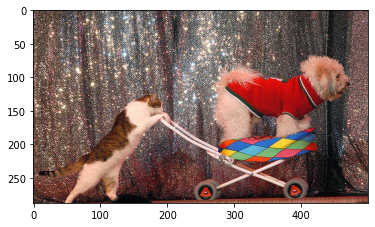

In [ ]:
plt.imshow(np.array(image))
plt.show()


> To downgrade opencv from 4.2 to 3.4.2.16 and have SIFT working.


In [ ]:
!pip uninstall opencv-python
!pip uninstall opencv-contrib-python
!pip install opencv-python==3.4.2.16
!pip install opencv-contrib-python==3.4.2.16

Uninstalling opencv-python-4.1.2.30:
  Would remove:
    /usr/local/lib/python3.6/dist-packages/cv2/*
    /usr/local/lib/python3.6/dist-packages/opencv_python-4.1.2.30.dist-info/*
Proceed (y/n)? y
  Successfully uninstalled opencv-python-4.1.2.30
Uninstalling opencv-contrib-python-4.1.2.30:
  Would remove:
    /usr/local/lib/python3.6/dist-packages/opencv_contrib_python-4.1.2.30.dist-info/*
Proceed (y/n)? y
  Successfully uninstalled opencv-contrib-python-4.1.2.30
     |████████████████████████████████| 25.0MB 136kB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
     |████████████████████████████████| 30.6MB 109kB/s 




> The first step is to explore the code examples for local keypoint detectors and descriptors (SIFT), then apply them on images from the trainset. (Consider the following tutorials to evaluate different detectors-descriptors: https://docs.opencv.org/4.5.1/da/df5/tutorial_py_sift_intro.html ) 



In [ ]:
import cv2 as cv

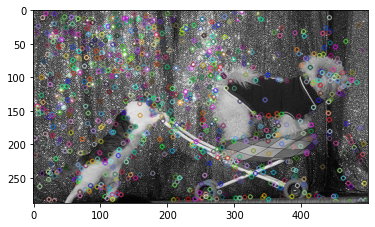

In [ ]:
img = np.array(image)
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
sift = cv.xfeatures2d.SIFT_create()
kp = sift.detect(gray,None) #only detect, can be also detectAndCompute at the same time
img = cv.drawKeypoints(gray,kp,img)
plt.imshow(img)

Visual difference before and after implementation the flag 
DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS

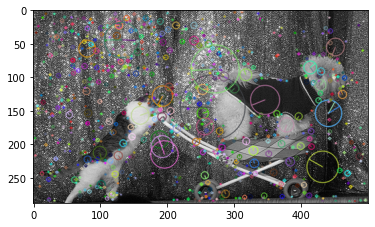

In [ ]:
img_rich = np.array(image)
cv.drawKeypoints(gray,kp,img_rich,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img_rich)

We are creating a function to easily plot two images, as this visual comparison can be useful in the future and be reusable multiple times. 
Keypoints detection results:

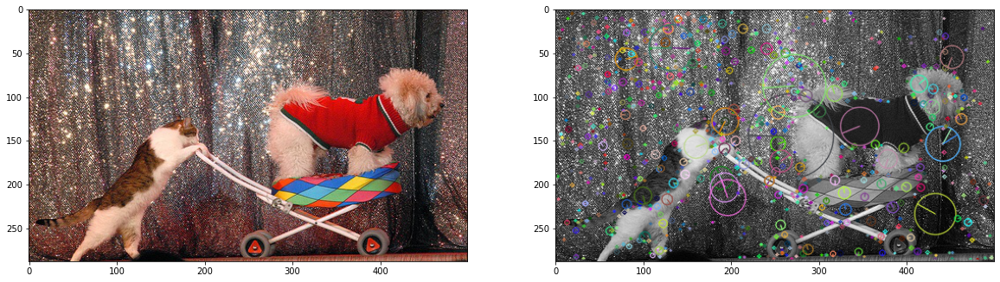

In [ ]:
def plot_two_images(first_image, second_image):
    plt.figure(figsize=(20,20))
    plt.axis('off')
    plt.subplot(1, 2, 1)
    plt.imshow(first_image)
    plt.subplot(1, 2, 2)
    plt.imshow(second_image)
    plt.show()
plot_two_images(image, img_rich)

Since we've already found keypoints, we can call `sift.compute()` which computes the descriptors from the keypoints we have found

In [ ]:
kp,des = sift.compute(gray,kp)
print(kp)
print(des)

[<KeyPoint 0x7f7f519c1120>, <KeyPoint 0x7f7f519c1270>, <KeyPoint 0x7f7f519c1360>, <KeyPoint 0x7f7f519c1390>, <KeyPoint 0x7f7f519c1300>, <KeyPoint 0x7f7f519c11e0>, <KeyPoint 0x7f7f519c1540>, <KeyPoint 0x7f7f519c1450>, <KeyPoint 0x7f7f519c1060>, <KeyPoint 0x7f7f517d0e40>, <KeyPoint 0x7f7f517d0a80>, <KeyPoint 0x7f7f517d0f90>, <KeyPoint 0x7f7f517d0cf0>, <KeyPoint 0x7f7f517d0cc0>, <KeyPoint 0x7f7f517d0fc0>, <KeyPoint 0x7f7f517d0f60>, <KeyPoint 0x7f7f517d0f30>, <KeyPoint 0x7f7f517d0db0>, <KeyPoint 0x7f7f517d0e10>, <KeyPoint 0x7f7f517d0de0>, <KeyPoint 0x7f7f517d0ed0>, <KeyPoint 0x7f7f517d0930>, <KeyPoint 0x7f7f517d0e70>, <KeyPoint 0x7f7f517d0ea0>, <KeyPoint 0x7f7f517d0b70>, <KeyPoint 0x7f7f517d0c60>, <KeyPoint 0x7f7f517d0f00>, <KeyPoint 0x7f7f517d0c30>, <KeyPoint 0x7f7f517d0c90>, <KeyPoint 0x7f7f517d0ae0>, <KeyPoint 0x7f7f517d0b40>, <KeyPoint 0x7f7f517d0d20>, <KeyPoint 0x7f7f517d0d50>, <KeyPoint 0x7f7f517d0990>, <KeyPoint 0x7f7f517d0d80>, <KeyPoint 0x7f7f517d0bd0>, <KeyPoint 0x7f7f517d09f0>, 

We are also creating a function for kepoints detection and computing to use it in the future. 

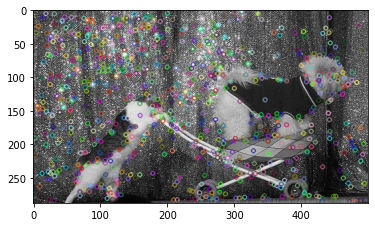

In [ ]:
def keypoints_detect(img, instance):
  gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
  kp, des = instance.detectAndCompute(gray,None) 
  img = cv.drawKeypoints(gray,kp,img, flags = 2)
  return kp, des
test = np.array(image)
keypoints_detect(test, sift)
plt.imshow(test)

The next step is to evaluate matching between pairs of images.

(Consider the following sample codes to build your project: https://docs.opencv.org/3.4.2/dc/dc3/tutorial_py_matcher.html )

Let's take just two images from the sataset and try to find matching keypoints between the images. I like animals so I will continue with my previous image.

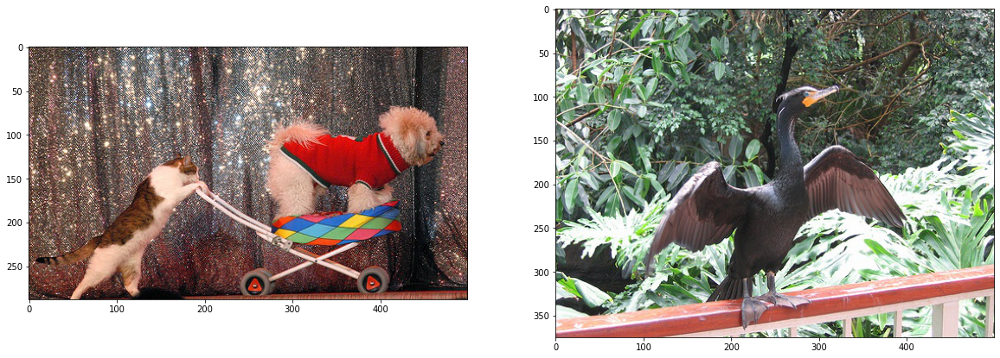

(375, 500, 3)
(288, 500, 3)


In [ ]:
image_one = np.array(image)
image_two = np.array(voc_trainset[501][0])
plot_two_images(image_one, image_two)
print(image_two.shape)
print(image_one.shape)

Let's find keypoint and compute descriptors for the selected images: 

Brute-Force Matching with ORB Descriptors. Let's find 10 first matches between the images:

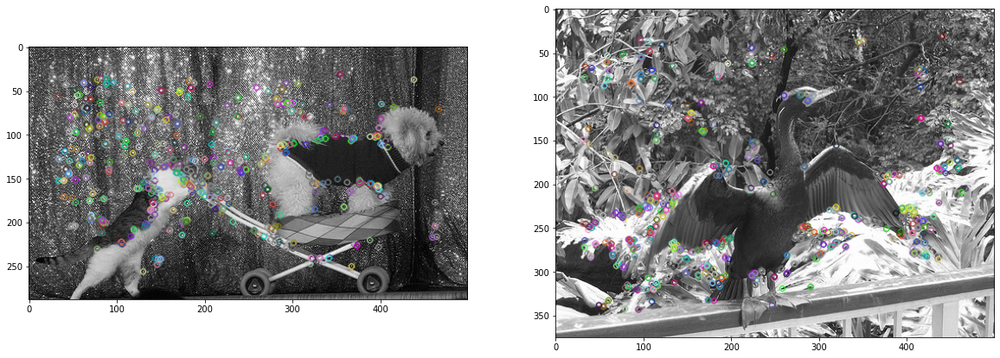

In [ ]:
orb = cv.ORB_create()
kp_one, des_one = keypoints_detect(image_one,orb)
kp_two, des_two = keypoints_detect(image_two,orb)
plot_two_images(image_one,image_two)

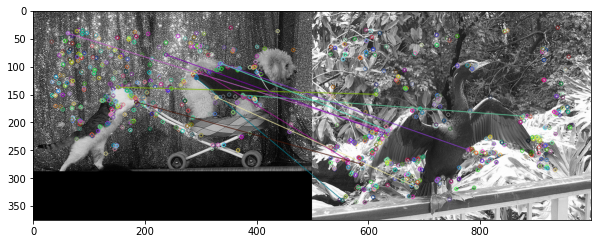

In [ ]:
# create BFMatcher object
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
# Match descriptors.
matches = bf.match(des_one, des_two)
# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)
# Draw first 10 matches.
image_matches = cv.drawMatches(image_one,kp_one,image_two,kp_two,matches[:10],image_two,  flags=2)
plt.figure(figsize=(10,10))
plt.imshow(image_matches)
plt.show()

And now let's use FLANN based Matcher and also try to find not 10 first matches, but best matches. 
I've executed tests to find the best coefficient, there is now matches for coefficient < 0.7, the coefficient > 0.8 gives too much results. So I sticked to 0.75

P.S. It doen't look the same way as in manual, even though I tried to follow step by step

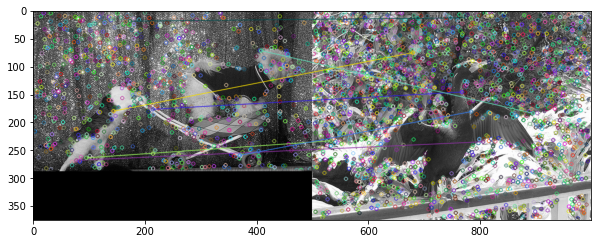

(<matplotlib.image.AxesImage at 0x7f2350522390>, None)

In [ ]:
image_one = np.array(image)
image_two = np.array(voc_trainset[501][0])
# find the keypoints and descriptors with SIFT
kp1, des1 = keypoints_detect(image_one,sift)
kp2, des2 = keypoints_detect(image_two,sift)
# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des1, des2, k=2)
# ratio test as per Lowe's paper
good = []
for m,n in matches:
    if m.distance < 0.75 * n.distance:
        good.append(m)
img3 = cv.drawMatches(image_one,kp1,image_two,kp2,good, image_two, flags=2)
plt.figure(figsize=(10,10))
plt.imshow(img3,),plt.show()

**Transformations**

Take some images from the training set, apply geometric transformations to these images and copy them back in the training set.

(Consider the following sample codes to build your project: https://docs.opencv.org/3.4.2/da/d6e/tutorial_py_geometric_transformations.html  )

You then pick one of the previous modified images, extract keypoints on that image and use matching to retrieve the initial image.

(Consider the following sample codes to build your project: https://docs.opencv.org/3.4.2/dc/dc3/tutorial_py_matcher.html )

**Scaling**  is just resizing of the image.

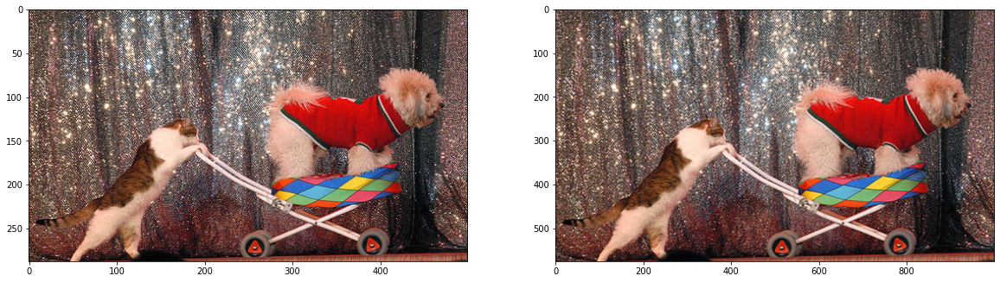

In [ ]:
image_test = np.array(image)
height, width = image_test.shape[:2]
image_scaled = cv.resize(image_test,(2*width, 2*height), interpolation = cv.INTER_CUBIC)
plot_two_images(image_test,image_scaled)

**Translation** is the shifting of object's location.

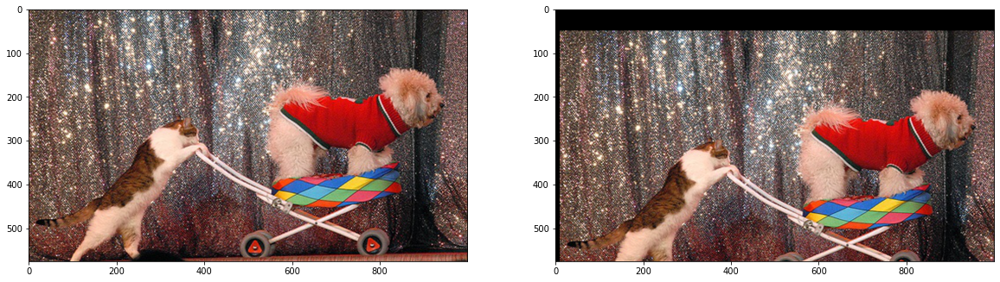

In [ ]:
rows,cols = image_scaled.shape[:2]
M = np.float32([[1,0,10],[0,1,50]])
image_tr = cv.warpAffine(image_scaled,M,(cols,rows))
plot_two_images(image_scaled,image_tr)

**Rotation** of an image for an angle θ is achieved by the transformation matrix 

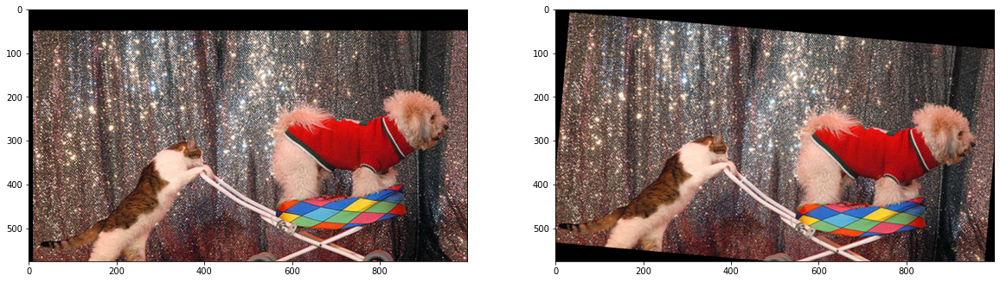

In [ ]:
rows,cols = image_tr.shape[:2]
# cols-1 and rows-1 are the coordinate limits.
M = cv.getRotationMatrix2D(((cols-1)/2.0,(rows-1)/2.0),355,1)
image_rotated = cv.warpAffine(image_tr,M,(cols,rows))
plot_two_images(image_tr, image_rotated)

In **affine transformation**, all parallel lines in the original image will still be parallel in the output image.

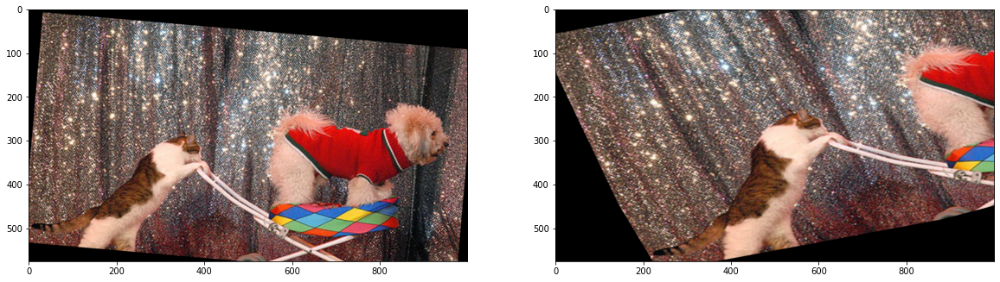

In [ ]:
rows,cols,ch = image_rotated.shape

pts1 = np.float32([[50,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])
M = cv.getAffineTransform(pts1,pts2)
image_affine = cv.warpAffine(image_rotated,M,(cols,rows))

plot_two_images(image_rotated, image_affine)

For **perspective transformation**, you need a 3x3 transformation matrix. Straight lines will remain straight even after the transformation.

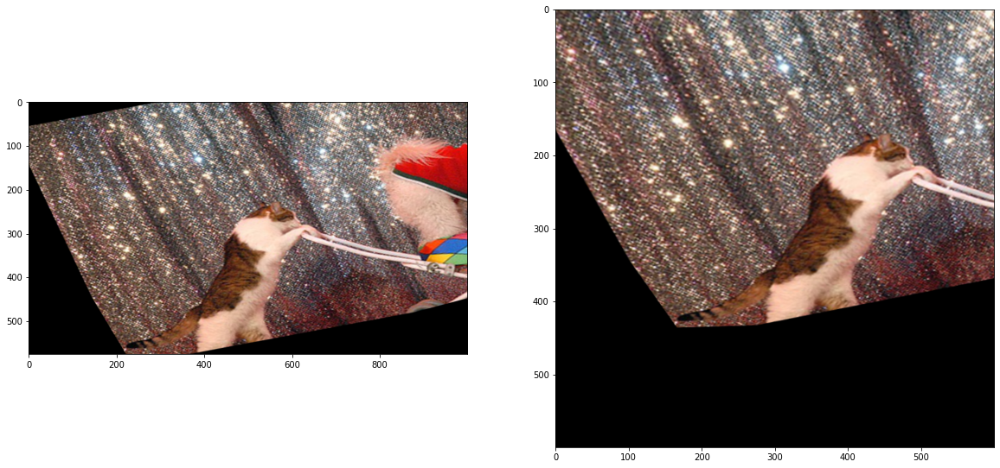

In [ ]:
rows,cols,ch = image_affine.shape

pts1 = np.float32([[56,65],[368,52],[28,387],[389,390]])
pts2 = np.float32([[0,0],[300,0],[0,300],[300,300]])
M = cv.getPerspectiveTransform(pts1,pts2)
image_persp = cv.warpPerspective(image_affine,M,(600,600))

plot_two_images(image_affine, image_persp)

After all these transformations, we are going to compare the transformed image to the dataset, and find the best match for it. Expected, that the best match will be the original image before the transformation. We are going inside the loop through each image, applying the keypoints detection and computing best match points for the required condition:  `m.distance < 0.75 * n.distance`. 



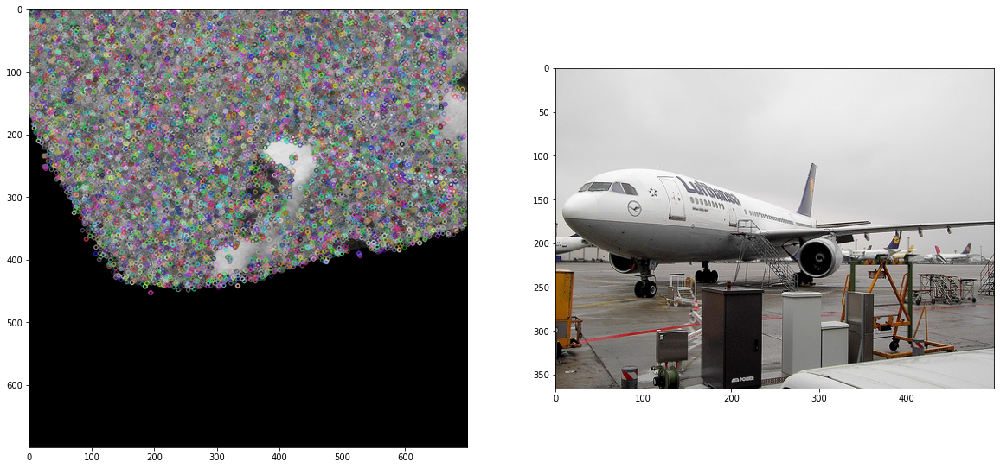

In [ ]:
image_final = image_persp
kp1, des1 = keypoints_detect(image_final,sift)
best_match_id = 0
good_list = []
for i in range(len(voc_trainset.images)):
  image_two = np.array(voc_trainset[i][0])
  kp2, des2 = keypoints_detect(image_two,sift)
# FLANN parameters
  FLANN_INDEX_KDTREE = 1
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv.FlannBasedMatcher(index_params, search_params)
  matches = flann.knnMatch(des1, des2, k=2)
# ratio test as per Lowe's paper
  good = []
  for m,n in matches:
      if m.distance < 0.75 * n.distance:
          good.append(m)
  if len(good) > len(good_list):
    good_list = good
    best_match_id = i

plot_two_images(image_final, voc_trainset[best_match_id][0])

Unfortunately, the results are negative. However, indeed, the matching points can be seen for these two images. We will try to decrise the last transformation as it generates more than 50% black space on the image. 

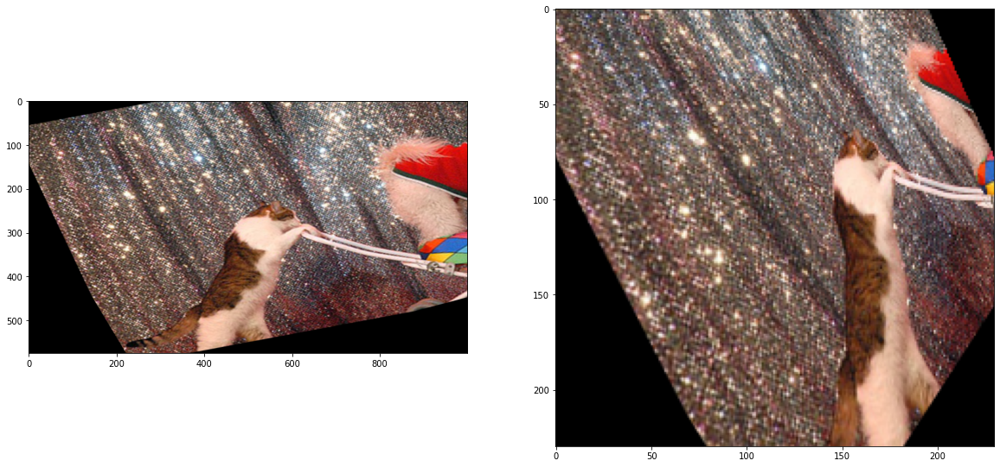

In [ ]:
rows,cols,ch = image_affine.shape

pts1 = np.float32([[56,65],[268,52],[28,287],[289,290]])
pts2 = np.float32([[0,0],[70,0],[0,120],[100,100]])
M = cv.getPerspectiveTransform(pts1,pts2)
image_persp = cv.warpPerspective(image_affine,M,(230,230))

plot_two_images(image_affine, image_persp)

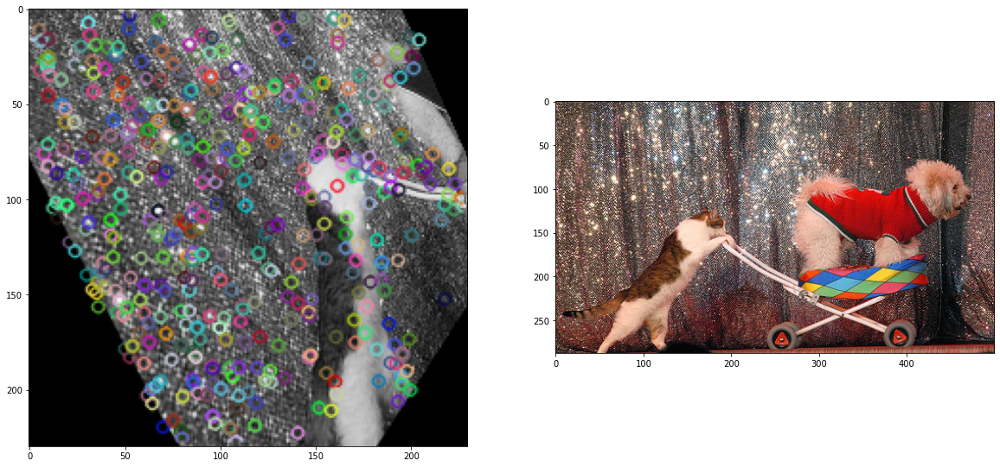

In [ ]:
image_final = image_persp
kp1, des1 = keypoints_detect(image_final,sift)
best_match_id = 0
good_list = []
for i in range(len(voc_trainset.images)):
  image_two = np.array(voc_trainset[i][0])
  kp2, des2 = keypoints_detect(image_two,sift)
# FLANN parameters
  FLANN_INDEX_KDTREE = 1
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)
  flann = cv.FlannBasedMatcher(index_params, search_params)
  matches = flann.knnMatch(des1, des2, k=2)
# ratio test as per Lowe's paper
  good = []
  for m,n in matches:
      if m.distance < 0.75 * n.distance:
          good.append(m)
  if len(good) > len(good_list):
    good_list = good
    best_match_id = i

plot_two_images(image_final, voc_trainset[best_match_id][0]) 

Yay! It worked. So it's possible to conclude, that more than 50% of space being just black confuses too much a matcher. 

Let's try another matcher, BFMatcher with knn and also decrease the treshhold to 0.6.  

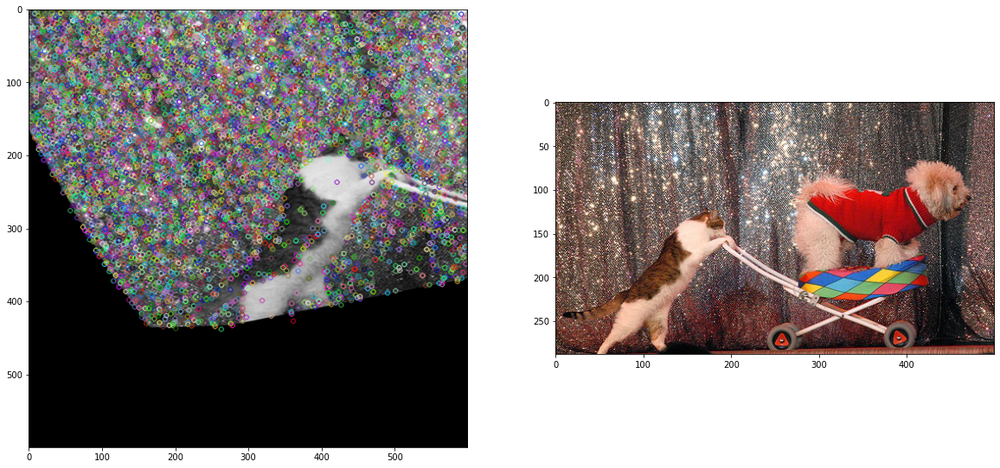

In [ ]:
image_final = image_persp
kp1, des1 = keypoints_detect(image_final,sift)
best_match_id = 0
good_list = []
for i in range(len(voc_trainset.images)):
  image_two = np.array(voc_trainset[i][0])
  kp2, des2 = keypoints_detect(image_two,sift)
# BFMatcher with default params
  bf = cv.BFMatcher()
  matches = bf.knnMatch(des1,des2, k=2)
# Apply ratio test
  good = []
  for m,n in matches:
      if m.distance < 0.6*n.distance:
          good.append([m])
  if len(good) > len(good_list):
    good_list = good
    best_match_id = i

plot_two_images(image_final, voc_trainset[best_match_id][0]) 

Yes, the BFMatcher was able to detect the best match and showed better results, even though it took it more than half an hour to be executed. I will use this matcher for the next project too. 